# Bulk Watershed DEM Downloader.
By - Nick Lewis.\
Advisors - Joanmarie Del Vecchio, Chuck Bailey.

# <p style="color: red;">OPEN IN GOOGLE COLAB OR JUPYTER NOTEBOOK.</p>
# <p style="color: red;">SAVE HUC10.CSV.GZ IN THE SAME DIRECTORY.</p>
#### If you know what you're doing, go ahead and open in your chosen IDE.

# Code begins here!

#### Below is a 'code cell'.  This is a block of text that Jupyter and Python use to perform tasks.

#### To run the following code cell and all code cells below, select the cell and press
# <p style="color: aqua;">Shift+Enter.</p>

In [1]:

# Import packages to our notebook.
# We must do this to use the functions contained inside the packages.
# Some functions have 'as' in the import call.  This is for less typing, and nothing else.
# Google any package name and 'docs' in order to find more detailed explanation of any one package.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline
import geopandas as gpd
import xdem
import os
import rasterio as rio
from rasterio.plot import show
import glob
from concurrent.futures import ThreadPoolExecutor
import requests
import shapely
from tqdm import tqdm


import json
from shapely.geometry import shape
from rasterio.mask import mask


#### Below is a code cell containing our **Constant** Variables, which you may change as you see fit for your particular analyses.

#### Below are 
- Integers
- Lists (denoted by square brackets at the beginning and end, separated by commas [a, b, c, d])
- Strings (contained within quotes 'Like this!')

In [ ]:
# Every time you change something within the code cell, run it once more to update the variable.

BOUNDS = [39.0, -80.0, 37.5, -81.5] # In decimal coordinate form.  Format: [N, E, S, W].  Select the smallest area possible in your analyses for maximum resoultion!  

API_KEY = '9086887f175d33aa72eda767f5b1e9cd' # Get your API key from opentopography.org.  Students get higher resolution data!

DEM_DATASET = 'USGS30m' # Options are USGS30m, USGS10m, & USGS1m.  Be warned!  As resolution goes up, available download area goes down.

PROJ_TITLE = 'n_lewis' # Create a succinct name with no spaces or leading digits to represent your project file for future exports.

PATH = os.getcwd()

#### If you can't remember what a function does, call the help() function and pass the name of the function you are wondering about inside the colons.

# First,
#### We download a DEM of the user selected area.

Directory "/sciclone/home/ntlewis/Nick-Lewis-Research/working_files/jupyter_proto/f_test" created successfully.
Querying API...
URL passed, now waiting for file to write.
File Written.
Plotting...


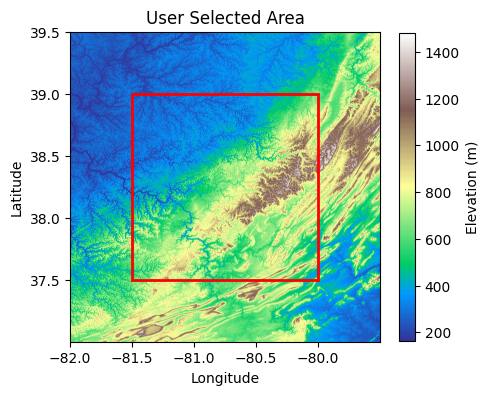

In [3]:
# Downloader
def downloader(bounds:list = BOUNDS, api_key:str = API_KEY, dem_dataset:str = DEM_DATASET, proj_title:str = PROJ_TITLE, path:str = PATH, buffer = True): # To call a function, we have to define it first.
    """
    This function takes in the user-defined constants and creates a directory.  It then places a geotiff in the directory.

    args: Bounds (list), api_key (str), dem_dataset (str), proj_title (str).

    returns: None.
    """

    # First, we make our directory for project files.
    try:
        os.mkdir(path = f'{path}/{proj_title}')
        print(f'Directory "{path}/{proj_title}" created successfully.') # Tries to make the directory for project files.
        proj_dir = f'{path}/{proj_title}'
    except FileExistsError:
        print(f'Directory "{path}/{proj_title}" already exists.') # If it doesnt work, it'll tell you!
        proj_dir = f'{path}/{proj_title}'
    except Exception as e:
        print(f'An error occurred: {e}')

    # Now to download our dem.
    dic = dict(zip(['north', 'east', 'south', 'west'], bounds)) # Makes a dictionary to let us more easily acess our bounds.
    if buffer == True:
        url = f'https://portal.opentopography.org/API/usgsdem?datasetName={dem_dataset}&south={dic["south"]-0.5}&north={dic["north"]+0.5}&west={dic["west"]-0.5}\
&east={dic["east"]+0.5}&outputFormat=GTiff&API_Key={api_key}' # Creates our URL so we can download.
    else:
        url = url = f'https://portal.opentopography.org/API/usgsdem?datasetName={dem_dataset}&south={dic["south"]}&north={dic["north"]}&west={dic["west"]}\
&east={dic["east"]}&outputFormat=GTiff&API_Key={api_key}' # Creates our URL so we can download.  BE WARNED! If buffer is false, there will be issues with the watershed DEMs.
    print('Querying API...')
    response = requests.get(url) # Saves what the URL spit back at us
    print('URL passed, now waiting for file to write.')
    with open(f'{proj_dir}/gtiff.tiff', 'wb') as file:
        file.write(response.content) # Writes the response to our project file
    print('File Written.')

    # Plotting
    print('Plotting...')
    fig, ax = plt.subplots(figsize=(5,5)) # Creates our figure object.
    ax.set_title('User Selected Area')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    with rio.open(f'{path}/{proj_title}/gtiff.tiff') as src: # Add in the basemap.
        basemap = show(src, cmap='terrain', ax=ax)
    im = basemap.get_images()[0]
    fig.colorbar(im, ax=ax, label='Elevation (m)', location='right', shrink=0.8) # Add colorbar
    bbox = patches.Rectangle((bounds[1],bounds[2]), width=(bounds[3]-bounds[1]), height=(bounds[0]-bounds[2]), linewidth=2, edgecolor='r', facecolor='none') # Add in bounding box from user.
    ax.add_patch(bbox)

    plt.show()

downloader(buffer = True) # Here, we call the function.

# Next,
#### We will clip out each watershed in your selected area.

In [ ]:
# bounds=BOUNDS
# #url for 12-digit HUCs is ../MapServer/6/
# #url = 'https://hydro.nationalmap.gov/arcgis/rest/services/wbd/MapServer/7/query?'   #14-Digit HUC
# # url = 'https://hydro.nationalmap.gov/arcgis/rest/services/wbd/MapServer/6/query?'   #12-Digit HUC
# # url = 'https://hydro.nationalmap.gov/arcgis/rest/services/wbd/MapServer/6/query?'   #12-Digit HUC
# url = 'https://hydro.nationalmap.gov/arcgis/rest/services/wbd/MapServer/5/query?'   #10-Digit HUC

# geometries_list = []
# properties_list = []

# user_AOI = f'{bounds[3]}, {bounds[2]}, {bounds[1]}, {bounds[0]}'

# #the parameters here will query the map server for the appropriate HU boundary
# params = dict(geometry=user_AOI,geometryType='esriGeometryEnvelope',inSR='4326',
#             spatialRel='esriSpatialRelIntersects',f='geojson')

# #Execute REST API call.  
# try:
#     r = requests.get(url,params=params)
# except:
#     print('Error with Service Call. This could mean that there is no hydrologic unit polygon where you selected.')

# #load API JSON output into a variable
# wbd_geojson = json.loads(r.content)
# print(wbd_geojson)   


# features = wbd_geojson['features']
# geometries = [shape(feature['geometry']) for feature in features]
# properties = [feature['properties']['name'] for feature in features]

# w_gdf_temp = pd.DataFrame({'Name': properties, 'geometry0' : geometries})
# gdf = gpd.GeoDataFrame(w_gdf_temp, geometry=w_gdf_temp['geometry0'], crs="EPSG:4326")

# clipped = gpd.GeoDataFrame(gdf.cx[bounds[3]:bounds[1], bounds[2]:bounds[0]]) # Clip it to the user's bounds.

# clipped.to_file(f'{path}/{proj_title}/wshed')

In [4]:
# Wshed Clipper
def wshed_clipper(proj_title = PROJ_TITLE, bounds = BOUNDS, path = PATH):
    """
    Creates seperate DEMs for each watershed in the user's selected bounds.  Places in their own folder within user's project directory.

    args: proj_title (str), bounds (list), path (current working directory).

    returns: None.
    """
    # PLACEHOLDER - Line to download wsheds csv
    # df = pd.read_csv(f'{os.getcwd}/{proj_title}/wsheds.csv') # We read in our wshed data
    print('Loading data...')
    # df = pd.read_csv(f'{PATH}/huc10.csv.gz') 
    # gdf = gpd.GeoDataFrame(data=df, crs=rio.CRS.from_epsg(4269), geometry=[shapely.wkt.loads(x) for x in df['geometry']]) # We turn it into a geodataframe to do geospatial stuff to.
    
    #url for 12-digit HUCs is ../MapServer/6/
    #url = 'https://hydro.nationalmap.gov/arcgis/rest/services/wbd/MapServer/7/query?'   #14-Digit HUC
    # url = 'https://hydro.nationalmap.gov/arcgis/rest/services/wbd/MapServer/6/query?'   #12-Digit HUC
    # url = 'https://hydro.nationalmap.gov/arcgis/rest/services/wbd/MapServer/6/query?'   #12-Digit HUC
    url = 'https://hydro.nationalmap.gov/arcgis/rest/services/wbd/MapServer/5/query?'   #10-Digit HUC

    user_AOI = f'{bounds[3]}, {bounds[2]}, {bounds[1]}, {bounds[0]}'

    #the parameters here will query the map server for the appropriate HU boundary
    params = dict(geometry=user_AOI,geometryType='esriGeometryEnvelope',inSR='4326',
                spatialRel='esriSpatialRelIntersects',f='geojson')

    #Execute REST API call.  
    try:
        r = requests.get(url,params=params)
    except:
        print('Error with Service Call. This could mean that there is no hydrologic unit polygon where you selected.')

    #load API JSON output into a variable
    wbd_geojson = json.loads(r.content)
    print(wbd_geojson)   


    features = wbd_geojson['features']
    geometries = [shape(feature['geometry']) for feature in features]
    properties = [feature['properties']['name'] for feature in features]

    w_gdf_temp = pd.DataFrame({'Name': properties, 'geometry0' : geometries})
    gdf = gpd.GeoDataFrame(w_gdf_temp, geometry=w_gdf_temp['geometry0'], crs="EPSG:4326")
    
    clipped = gpd.GeoDataFrame(gdf.cx[bounds[3]:bounds[1], bounds[2]:bounds[0]]) # Clip it to the user's bounds.

    # Now that we have a GDF (GeoDataFrame) with the user's chosen watersheds and the larger dem, lets export DEMs of each watershed.
    try:
        os.mkdir(path = f'{path}/{proj_title}/wshed_dems') # Makes a directory to store these new dems.
        print(f'Directory "{path}/{proj_title}/wshed_dems" created successfully.') # Tries to make the directory for project files.
    except FileExistsError:
        print(f'Directory "{path}/{proj_title}/wshed_dems" already exists.') # If it doesnt work, it'll tell you!
    except Exception as e:
        print(f'An error occurred: {e}')
    
    # We have our directory, lets populate it.
    print('Writing new DEMs...')
    with rio.open(f'{path}/{proj_title}/gtiff.tiff') as src: # Loads in our larger df.
        total_tasks=len(clipped)
        with tqdm(total=total_tasks, desc='Progress') as pbar: # This is for the fancy progress bar.
            for name_orig in clipped['Name'].unique():
                name = name_orig.replace(' ', '_')
                geom = (clipped.loc[clipped['Name']==name_orig].geometry)
                print(f'Geom is {geom}')

                out_image, out_transform = mask(src, geom, crop=True) # Clips the DEM to our watershed's shape.  Sets nodata value to LSDTopyTools standard.

                # Below is metadata stuff, dont stress about this.
                out_meta = src.meta.copy()
                out_meta.update({
                    "driver": "GTiff",
                    "height": out_image.shape[1],
                    "width": out_image.shape[2],
                    "transform": out_transform
                    })

                out_path = f'{path}/{proj_title}/wshed_dems/{name}.tiff' # Create a pathname.
                with rio.open(out_path, "w", **out_meta) as file:
                    file.write(out_image) # Write to file.
                pbar.update(1)

# Call our function, let it do the work.           
wshed_clipper()

Loading data...
{'type': 'FeatureCollection', 'features': [{'type': 'Feature', 'geometry': {'type': 'Polygon', 'coordinates': [[[-81.1112725925763, 37.855474765859334], [-81.1112821263964, 37.855488337124115], [-81.11128226653358, 37.85558056051928], [-81.1112823779247, 37.85565526971869], [-81.11129058044153, 37.855671473771785], [-81.1113665491685, 37.85582153876635], [-81.11137287690136, 37.85583403825818], [-81.11149349279624, 37.85603662718417], [-81.11176431059988, 37.85611983721651], [-81.11220053699343, 37.85619096264747], [-81.11262165192726, 37.85621440749801], [-81.1129826866366, 37.85628560305519], [-81.11340389050365, 37.856368664569864], [-81.1139002743768, 37.856439725926855], [-81.11429114932324, 37.856355883589906], [-81.11462175809389, 37.856200555496756], [-81.11486205653407, 37.855997619479076], [-81.11531274849862, 37.855699086474345], [-81.11562829791185, 37.85553184686319], [-81.11592900715658, 37.85549578238112], [-81.11627483518478, 37.85545966965062], [-81.116

Progress:   1%|▏         | 1/67 [00:00<00:08,  7.85it/s]

Geom is 0    POLYGON ((-81.11127 37.85547, -81.11128 37.855...
Name: geometry, dtype: geometry
Geom is 1    POLYGON ((-80.59068 39.03381, -80.59082 39.034...
Name: geometry, dtype: geometry
Geom is 2    POLYGON ((-80.7533 39.16317, -80.75335 39.1631...
Name: geometry, dtype: geometry


Progress:   4%|▍         | 3/67 [00:00<00:05, 11.02it/s]

Geom is 3    POLYGON ((-80.74703 38.99351, -80.74744 38.993...
Name: geometry, dtype: geometry


Progress:   7%|▋         | 5/67 [00:00<00:08,  7.59it/s]

Geom is 4    POLYGON ((-81.02773 38.88263, -81.02815 38.882...
Name: geometry, dtype: geometry
Geom is 5    POLYGON ((-81.24512 38.94767, -81.24536 38.948...
Name: geometry, dtype: geometry


Progress:  12%|█▏        | 8/67 [00:00<00:05,  9.90it/s]

Geom is 6    POLYGON ((-81.34659 38.96697, -81.34698 38.967...
Name: geometry, dtype: geometry
Geom is 7    POLYGON ((-81.45778 39.05028, -81.45807 39.050...
Name: geometry, dtype: geometry
Geom is 8    POLYGON ((-81.39408 39.13923, -81.39463 39.139...
Name: geometry, dtype: geometry


Progress:  15%|█▍        | 10/67 [00:01<00:06,  9.22it/s]

Geom is 9    POLYGON ((-81.55292 39.04905, -81.55319 39.049...
Name: geometry, dtype: geometry
Geom is 10    POLYGON ((-81.80762 38.92039, -81.80772 38.920...
Name: geometry, dtype: geometry
Geom is 11    POLYGON ((-80.55938 39.07703, -80.55945 39.077...
Name: geometry, dtype: geometry


Progress:  18%|█▊        | 12/67 [00:01<00:05,  9.53it/s]

Geom is 12    POLYGON ((-79.88485 38.30894, -79.8852 38.3089...
Name: geometry, dtype: geometry
Geom is 13    POLYGON ((-80.63659 38.2892, -80.63679 38.2892...
Name: geometry, dtype: geometry


Progress:  24%|██▍       | 16/67 [00:01<00:04, 10.71it/s]

Geom is 14    POLYGON ((-80.75575 38.28393, -80.75657 38.284...
Name: geometry, dtype: geometry
Geom is 15    POLYGON ((-80.57238 38.61712, -80.57245 38.617...
Name: geometry, dtype: geometry
Geom is 16    POLYGON ((-80.42999 38.4092, -80.43073 38.4093...
Name: geometry, dtype: geometry


Progress:  27%|██▋       | 18/67 [00:01<00:04, 11.23it/s]

Geom is 17    POLYGON ((-80.44675 38.46438, -80.4471 38.4647...
Name: geometry, dtype: geometry
Geom is 18    POLYGON ((-79.64911 38.48432, -79.65011 38.484...
Name: geometry, dtype: geometry
Geom is 19    POLYGON ((-80.9691 37.69446, -80.96895 37.6949...
Name: geometry, dtype: geometry


Progress:  33%|███▎      | 22/67 [00:02<00:05,  7.50it/s]

Geom is 20    POLYGON ((-80.88047 37.64861, -80.88112 37.649...
Name: geometry, dtype: geometry
Geom is 21    POLYGON ((-80.4301 37.73253, -80.43049 37.7325...
Name: geometry, dtype: geometry
Geom is 22    POLYGON ((-80.15248 37.5468, -80.15427 37.5469...
Name: geometry, dtype: geometry


Progress:  36%|███▌      | 24/67 [00:02<00:05,  8.30it/s]

Geom is 23    POLYGON ((-80.90902 38.94443, -80.90964 38.944...
Name: geometry, dtype: geometry
Geom is 24    POLYGON ((-80.1532 39.1064, -80.15334 39.10655...
Name: geometry, dtype: geometry


Progress:  42%|████▏     | 28/67 [00:03<00:04,  9.69it/s]

Geom is 25    POLYGON ((-80.51292 38.71385, -80.51301 38.713...
Name: geometry, dtype: geometry
Geom is 26    POLYGON ((-80.97014 38.53445, -80.97018 38.534...
Name: geometry, dtype: geometry
Geom is 27    POLYGON ((-81.2371 38.65121, -81.23747 38.6513...
Name: geometry, dtype: geometry
Geom is 28    POLYGON ((-81.47436 38.75382, -81.47486 38.754...
Name: geometry, dtype: geometry


Progress:  45%|████▍     | 30/67 [00:03<00:03,  9.72it/s]

Geom is 29    POLYGON ((-81.52178 37.95467, -81.52195 37.954...
Name: geometry, dtype: geometry
Geom is 30    POLYGON ((-79.69457 39.11356, -79.69513 39.113...
Name: geometry, dtype: geometry


Progress:  48%|████▊     | 32/67 [00:03<00:04,  7.97it/s]

Geom is 31    POLYGON ((-81.32302 37.72437, -81.32313 37.724...
Name: geometry, dtype: geometry
Geom is 32    POLYGON ((-81.50291 37.7901, -81.50308 37.7901...
41    POLYGON ((-81.45814 37.98822, -81.45814 37.988...
Name: geometry, dtype: geometry


Progress:  51%|█████     | 34/67 [00:04<00:04,  7.59it/s]

Geom is 33    POLYGON ((-81.51105 37.67182, -81.51147 37.671...
Name: geometry, dtype: geometry
Geom is 34    POLYGON ((-81.44476 38.201, -81.44502 38.20104...
Name: geometry, dtype: geometry
Geom is 35    POLYGON ((-81.4445 38.36879, -81.445 38.36902,...
Name: geometry, dtype: geometry


Progress:  57%|█████▋    | 38/67 [00:04<00:02,  9.96it/s]

Geom is 36    POLYGON ((-80.17846 38.62424, -80.17886 38.624...
Name: geometry, dtype: geometry
Geom is 37    POLYGON ((-80.69014 38.6202, -80.6909 38.6204,...
Name: geometry, dtype: geometry
Geom is 38    POLYGON ((-80.73726 38.71795, -80.73732 38.718...
Name: geometry, dtype: geometry


Progress:  60%|█████▉    | 40/67 [00:04<00:02, 10.12it/s]

Geom is 39    POLYGON ((-81.44672 38.45137, -81.44735 38.451...
Name: geometry, dtype: geometry
Geom is 40    POLYGON ((-81.40585 38.58309, -81.40632 38.583...
Name: geometry, dtype: geometry
Geom is 42    POLYGON ((-81.87207 38.40772, -81.87221 38.407...
Name: geometry, dtype: geometry


Progress:  64%|██████▍   | 43/67 [00:05<00:03,  7.91it/s]

Geom is 43    POLYGON ((-79.78485 37.60648, -79.7854 37.6065...
Name: geometry, dtype: geometry
Geom is 44    POLYGON ((-79.87706 38.02023, -79.87792 38.020...
Name: geometry, dtype: geometry


Progress:  67%|██████▋   | 45/67 [00:05<00:02,  8.96it/s]

Geom is 45    POLYGON ((-80.01609 37.49972, -80.01687 37.500...
Name: geometry, dtype: geometry
Geom is 46    POLYGON ((-79.89422 37.72, -79.89462 37.7208, ...
Name: geometry, dtype: geometry
Geom is 47    POLYGON ((-80.07432 37.93857, -80.07498 37.938...
Name: geometry, dtype: geometry


Progress:  72%|███████▏  | 48/67 [00:05<00:02,  8.96it/s]

Geom is 48    POLYGON ((-80.06611 37.7661, -80.06633 37.7665...
Name: geometry, dtype: geometry
Geom is 49    POLYGON ((-80.52553 37.63758, -80.52549 37.637...
Name: geometry, dtype: geometry


Progress:  75%|███████▍  | 50/67 [00:05<00:01, 10.03it/s]

Geom is 50    POLYGON ((-80.30604 38.19896, -80.30634 38.198...
Name: geometry, dtype: geometry
Geom is 51    POLYGON ((-79.94941 38.39678, -79.94976 38.396...
Name: geometry, dtype: geometry


Progress:  79%|███████▉  | 53/67 [00:06<00:01,  9.12it/s]

Geom is 52    POLYGON ((-80.27908 37.87881, -80.27927 37.878...
Name: geometry, dtype: geometry
Geom is 53    POLYGON ((-80.47517 38.06411, -80.47522 38.064...
Name: geometry, dtype: geometry
Geom is 54    POLYGON ((-80.23949 37.98413, -80.23967 37.984...
Name: geometry, dtype: geometry


Progress:  82%|████████▏ | 55/67 [00:06<00:01,  7.70it/s]

Geom is 55    POLYGON ((-80.97056 37.92515, -80.97074 37.925...
Name: geometry, dtype: geometry
Geom is 56    POLYGON ((-81.15838 38.1719, -81.15885 38.1722...
Name: geometry, dtype: geometry


Progress:  84%|████████▎ | 56/67 [00:06<00:01,  7.71it/s]

Geom is 57    POLYGON ((-80.43851 38.35152, -80.43851 38.351...
Name: geometry, dtype: geometry
Geom is 58    POLYGON ((-80.94593 38.19323, -80.94629 38.193...
Name: geometry, dtype: geometry


Progress:  90%|████████▉ | 60/67 [00:06<00:00,  9.76it/s]

Geom is 59    POLYGON ((-80.9295 38.37392, -80.92986 38.3739...
Name: geometry, dtype: geometry
Geom is 60    POLYGON ((-81.35347 38.30418, -81.35376 38.304...
Name: geometry, dtype: geometry
Geom is 61    POLYGON ((-80.61261 38.46144, -80.61321 38.461...
Name: geometry, dtype: geometry


Progress:  93%|█████████▎| 62/67 [00:07<00:00,  9.28it/s]

Geom is 62    POLYGON ((-81.38409 38.21008, -81.38475 38.210...
Name: geometry, dtype: geometry
Geom is 63    POLYGON ((-79.94801 38.80156, -79.94816 38.801...
Name: geometry, dtype: geometry
Geom is 64    POLYGON ((-80.06011 39.06455, -80.06073 39.064...
Name: geometry, dtype: geometry


Progress:  99%|█████████▊| 66/67 [00:07<00:00,  8.89it/s]


Geom is 65    POLYGON ((-79.81739 39.11571, -79.81779 39.116...
Name: geometry, dtype: geometry
Geom is 66    POLYGON ((-80.04699 38.11797, -80.04731 38.118...
Name: geometry, dtype: geometry


# Also,
#### We can map relief for each watershed (optional, do it if you're curious!)

In [5]:
# Relief & LSHT toolbox
def map_relief(dem_dir=f'{PATH}/{PROJ_TITLE}/wshed_dems'):
    """
    Takes DEMs of watersheds and produces TRI (Terrain ruggedness index, an SLRM) for each DEM.  Saves to own folder.

    args: dem_dir (path to wshed DEMs folder).

    returns: None.
    """
    # Glob a list of paths to the DEMs.
    path_list = glob.glob(f'{dem_dir}/*.tiff')
 
    try:
        os.mkdir(f'{PATH}/{PROJ_TITLE}/tri_pngs')
        print(f'Directory "{PATH}/{PROJ_TITLE}/tri_pngs" made sucessfully.')
    except FileExistsError:
        print(f'Directory "{PATH}/{PROJ_TITLE}/tri_pngs" Exists')
        pass
    except Exception as e:
        print(f'An error occured: {e}')
    print('Saving figures...')
    with tqdm(total=len(path_list), desc='Progress') as pbar:
        for path in path_list:
            tri = xdem.DEM(path).terrain_ruggedness_index()
            plt.ioff()
            fig, ax = plt.subplots(dpi=250)
            _ = tri.plot(cmap='magma', ax=ax, cbar_title='Relief (m)')
            name = path.split(sep='/')[-1][:-5]
            name_no_und = name.replace('_',' ')
            ax.set_title(f'{name_no_und} Terrain Ruggedness Index')
            ax.set_ylabel('Latitude (°)')
            ax.set_xlabel('Longitude (°)')
            fig.tight_layout()
            plt.savefig(f'{PATH}/{PROJ_TITLE}/tri_pngs/{name}_TRI.png')
            plt.close()
            pbar.update(1)

map_relief()

Directory "/sciclone/home/ntlewis/Nick-Lewis-Research/working_files/jupyter_proto/f_test/tri_pngs" made sucessfully.
Saving figures...


Progress: 100%|██████████| 66/66 [00:51<00:00,  1.27it/s]
